In [1]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import geopy.distance
from math import radians,cos,sin,asin,sqrt
from scipy.stats import ttest_ind

In [2]:
pip install geopy


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install h3

Note: you may need to restart the kernel to use updated packages.


In [4]:
import os

In [5]:
os.listdir(r"/Users/ilkaymueller/Documents/GitHub/Data_Analysis_Projects/uber_files")

['Choropleth map.ipynb',
 '.DS_Store',
 'other-Lyft_B02510.csv',
 'Uber- NYC.ipynb',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Skyline_B00111.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-janjune-15.csv',
 'other-American_B01362.csv',
 'uber-raw-data-apr14.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'README.md',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 '.ipynb_checkpoints',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv',
 'other-Prestige_B01338.csv']

In [6]:
uber_15 = pd.read_csv('uber-raw-data-janjune-15_sample.csv')
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140
...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234
99996,B02764,2015-03-06 21:32:00,B02764,24
99997,B02598,2015-03-19 19:56:00,B02598,17
99998,B02682,2015-05-02 16:02:00,B02682,68


In [7]:
uber_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   Dispatching_base_num  100000 non-null  object
 1   Pickup_date           100000 non-null  object
 2   Affiliated_base_num   98882 non-null   object
 3   locationID            100000 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 3.1+ MB


# Cleaning the data

Cleaning Duplicates

In [8]:
uber_15.duplicated().sum()

54

In [9]:
uber_15.drop_duplicates(inplace = True)

In [10]:
uber_15.shape

(99946, 4)

Missing Values

In [11]:
uber_15.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [12]:
#not going to remove nulls, as affiliated base number is not crucial

# Transformations

Fix the Time from str to datetime

In [13]:
uber_15['Pickup_date'][0]

'2015-05-02 21:43:00'

In [14]:
type(uber_15['Pickup_date'][0])

str

In [15]:
#apparently timestamp transformed to string, I will switch it back

In [16]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])

In [17]:
#now checking
uber_15['Pickup_date'].dtype

dtype('<M8[ns]')

In [18]:
type(uber_15['Pickup_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [19]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

Which month has the most pickups?

In [20]:
uber_15['month'] = uber_15['Pickup_date'].dt.month_name()

In [21]:
uber_15['month']

0            May
1        January
2          March
3          April
4          March
          ...   
99995      April
99996      March
99997      March
99998        May
99999       June
Name: month, Length: 99946, dtype: object

In [22]:
uber_15['month'].value_counts()

June        19620
May         18660
April       15982
March       15969
February    15896
January     13819
Name: month, dtype: int64

In [23]:
uber_15['month'].value_counts().head(1)

June    19620
Name: month, dtype: int64

OR

In [24]:
by_month = uber_15.groupby("month")

In [25]:
by_month.count()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
month,,,,
April,15982,15982,15982,15982
February,15896,15896,15349,15896
January,13819,13819,13250,13819
June,19620,19620,19620,19620
March,15969,15969,15969,15969
May,18660,18660,18660,18660


OR Visualize

<AxesSubplot:>

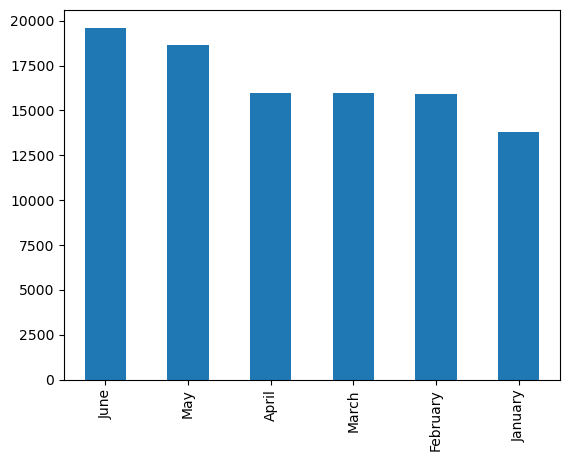

In [26]:
uber_15['month'].value_counts().plot(kind = 'bar')

Deriving hour, min, day name from the date time

In [27]:
uber_15['weekday'] = uber_15['Pickup_date'].dt.day_name()

In [28]:
uber_15['hour'] = uber_15['Pickup_date'].dt.hour
uber_15['minute'] = uber_15['Pickup_date'].dt.minute
uber_15['day'] = uber_15['Pickup_date'].dt.day

In [29]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,hour,minute,day
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,21,43,2
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,19,52,20
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,20,26,19
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,17,38,10
4,B02764,2015-03-23 07:03:00,B00111,140,March,Monday,7,3,23


# Analyzing: Making a crosstab(pivot)

In [30]:
pivot = pd.crosstab(index = uber_15['month'], columns = uber_15['weekday'])
pivot

weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,2365,1833,2508,2052,2823,1880,2521
February,2655,1970,2550,2183,2396,2129,2013
January,2508,1353,2745,1651,2378,1444,1740
June,2793,2848,3037,2485,2767,3187,2503
March,2465,2115,2522,2379,2093,2388,2007
May,3262,1865,3519,2944,2627,2115,2328


In [31]:
#automatically grouped chart because of pivot

<AxesSubplot:xlabel='month'>

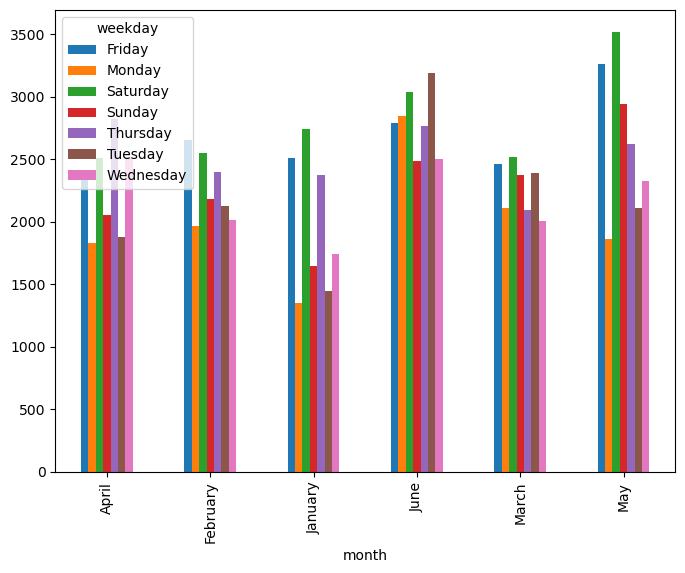

In [32]:
pivot.plot(kind = 'bar', figsize = (8,6))

In [33]:
#looks like May and June are more common for uber services and 
#saturdays and fridays (2nd) have the highest pickups

# Rush Hour

In [34]:
rush = uber_15.groupby(['weekday', 'hour'], as_index = False).size()
rush

,weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


<AxesSubplot:xlabel='hour', ylabel='size'>

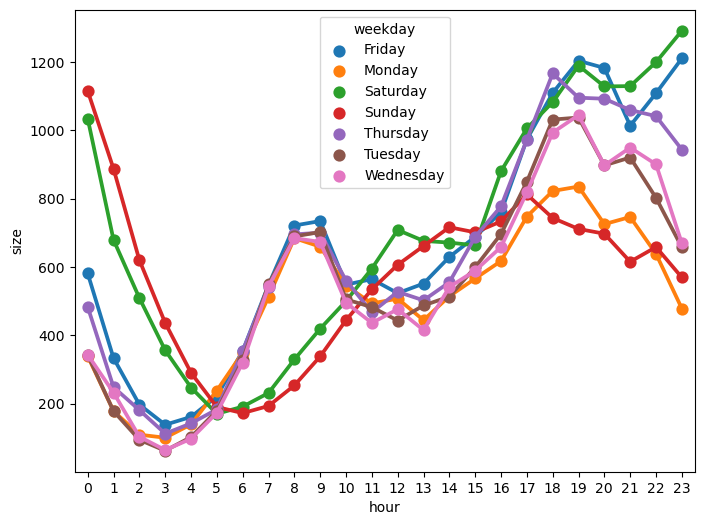

In [35]:
plt.figure(figsize = (8,6))
sns.pointplot(x='hour', y = 'size', hue = 'weekday', data = rush)

In [36]:
foil = pd.read_csv('Uber-Jan-Feb-FOIL.csv')
foil

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537
...,...,...,...,...
349,B02764,2/28/2015,3952,39812
350,B02617,2/28/2015,1372,14022
351,B02682,2/28/2015,1386,14472
352,B02512,2/28/2015,230,1803


In [37]:
foil.shape

(354, 4)

In [38]:
!pip install chart_studio 
!pip install plotly

In [39]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px

from plotly.offline import download_plotlyjs , init_notebook_mode , plot , iplot 

In [40]:
init_notebook_mode(connected=True)

In [41]:
foil.columns

Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

In [42]:
px.box(x='dispatching_base_number', y = 'active_vehicles', data_frame = foil)

In [43]:
#trying violin for better look

In [44]:
px.violin(x='dispatching_base_number', y = 'active_vehicles', data_frame = foil)

april14-sept14 df

In [45]:
os.listdir(r"/Users/ilkaymueller/Documents/GitHub/Data_Analysis_Projects/uber_files")

['Choropleth map.ipynb',
 '.DS_Store',
 'other-Lyft_B02510.csv',
 'Uber- NYC.ipynb',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Skyline_B00111.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-janjune-15.csv',
 'other-American_B01362.csv',
 'uber-raw-data-apr14.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'README.md',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 '.ipynb_checkpoints',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv',
 'other-Prestige_B01338.csv']

# Concating for a bigger DB

In [46]:
files = os.listdir(r"/Users/ilkaymueller/Documents/GitHub/Data_Analysis_Projects/uber_files")[-14:]
files

['Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'README.md',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 '.ipynb_checkpoints',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv',
 'other-Prestige_B01338.csv']

In [47]:
files.remove('Uber-Jan-Feb-FOIL.csv')
files.remove('other-Highclass_B01717.csv')
files.remove('other-Federal_02216.csv')
files.remove('other-Carmel_B00256.csv')
files.remove('other-Diplo_B01196.csv')
files.remove('.ipynb_checkpoints')
files.remove('other-Dial7_B00887.csv')
files.remove('other-Prestige_B01338.csv')
files.remove('README.md')

In [48]:
files

['uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv']

In [49]:
final = pd.DataFrame()

path = r"/Users/ilkaymueller/Documents/GitHub/Data_Analysis_Projects/uber_files"

for file in files:
    current_df = pd.read_csv(path+'/'+file)
    final = pd.concat([current_df, final])

In [50]:
final.shape

(3969811, 4)

# Cleaning 

In [51]:
final.duplicated().sum()

74832

In [52]:
final.drop_duplicates(inplace=True)

In [53]:
final.shape

(3894979, 4)

In [54]:
final.head()

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512
2,5/1/2014 0:15:00,40.7464,-73.9838,B02512
3,5/1/2014 0:17:00,40.7463,-74.0011,B02512
4,5/1/2014 0:17:00,40.7594,-73.9734,B02512


# Creating 15 min bins

In [55]:
uber_data = final

In [56]:
uber_data['Date/Time'] = pd.to_datetime(uber_data['Date/Time'])

In [57]:
uber_data['BinnedHour']=uber_data['Date/Time'].dt.floor('15min')

In [58]:
uber_data['BinnedHour']

0        2014-05-01 00:00:00
1        2014-05-01 00:00:00
2        2014-05-01 00:15:00
3        2014-05-01 00:15:00
4        2014-05-01 00:15:00
                 ...        
829269   2014-08-31 23:45:00
829270   2014-08-31 23:45:00
829272   2014-08-31 23:45:00
829273   2014-08-31 23:45:00
829274   2014-08-31 23:45:00
Name: BinnedHour, Length: 3894979, dtype: datetime64[ns]

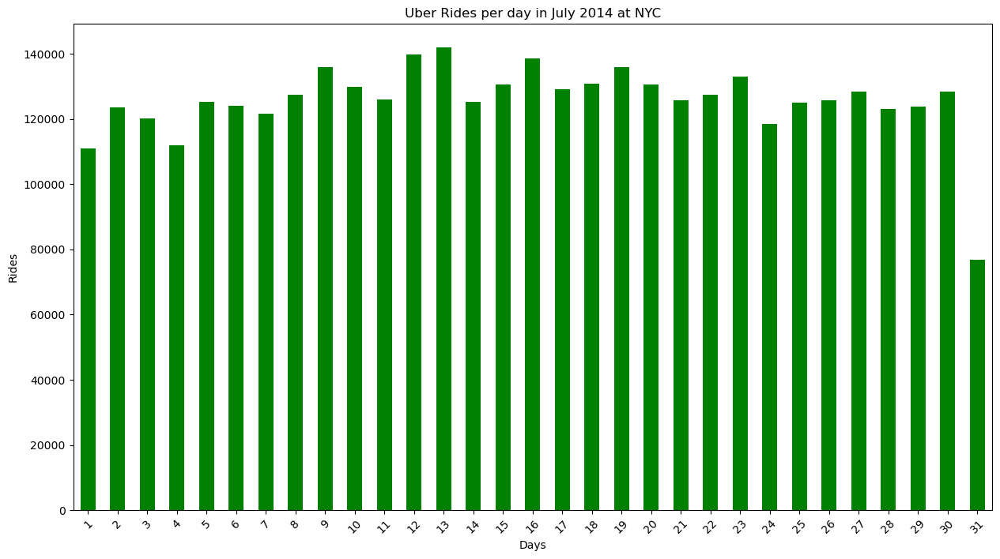

In [59]:
plt.figure(figsize=(15,8))
uber_data['BinnedHour'].dt.day.value_counts().sort_index().plot(kind='bar',color='green')
for item in plt.gca().get_xticklabels():
    item.set_rotation(45)
plt.title('Uber Rides per day in July 2014 at NYC')
plt.xlabel('Days')
_=plt.ylabel('Rides')

In [60]:
#possibly recurring pattern after day 11

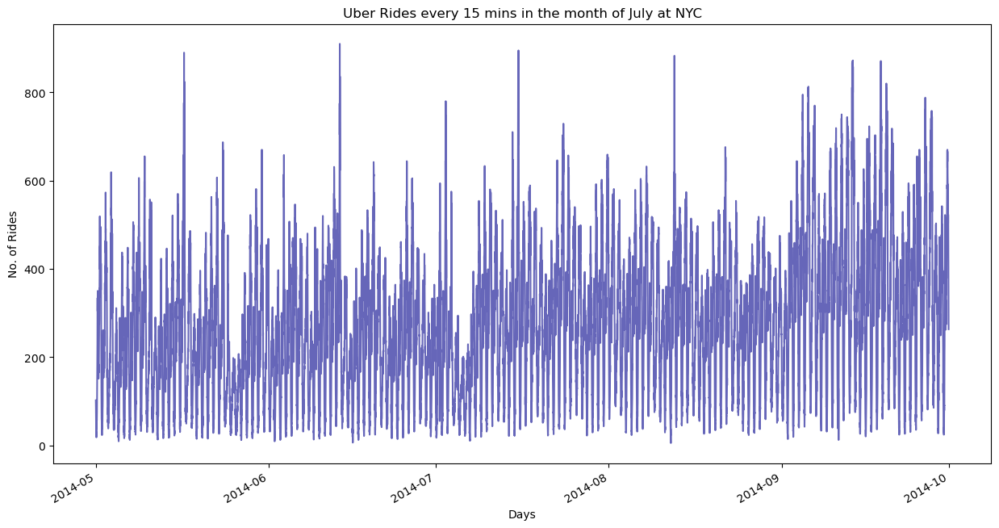

In [61]:
plt.figure(figsize=(15,8))
uber_data['BinnedHour'].value_counts().sort_index().plot(c='darkblue',alpha=0.6)
plt.title('Uber Rides every 15 mins in the month of July at NYC')
plt.xlabel('Days')
_=plt.ylabel('No. of Rides')

#alpha stands for the color, how dark is it

# Day wise

Cleaning and transforming

In [62]:
DayMap={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}

In [63]:
uber_data['Day'] = uber_data['BinnedHour'].dt.weekday.map(DayMap)

In [64]:
uber_data['Date'] = uber_data['BinnedHour'].dt.date

In [65]:
#creating ordered category for the day
uber_data['Day']=pd.Categorical(uber_data['Day'],categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],ordered=True)

In [66]:
uber_data['Time'] = uber_data['BinnedHour'].dt.time

In [67]:
weekly = uber_data.groupby(['Date','Day','Time']).count().dropna().rename(columns={'BinnedHour':'Rides'})['Rides'].reset_index()
weekly

,Date,Day,Time,Rides
0,2014-05-01,Monday,00:00:00,0
1,2014-05-01,Monday,00:15:00,0
2,2014-05-01,Monday,00:30:00,0
3,2014-05-01,Monday,00:45:00,0
4,2014-05-01,Monday,01:00:00,0
...,...,...,...,...
102811,2014-09-30,Sunday,22:45:00,0
102812,2014-09-30,Sunday,23:00:00,0
102813,2014-09-30,Sunday,23:15:00,0
102814,2014-09-30,Sunday,23:30:00,0


In [68]:
day_wise = weekly.groupby(['Day']).sum()
day_wise

,Rides
Day,
Monday,472058
Tuesday,561796
Wednesday,576484
Thursday,657418
Friday,638547
Saturday,558042
Sunday,430634


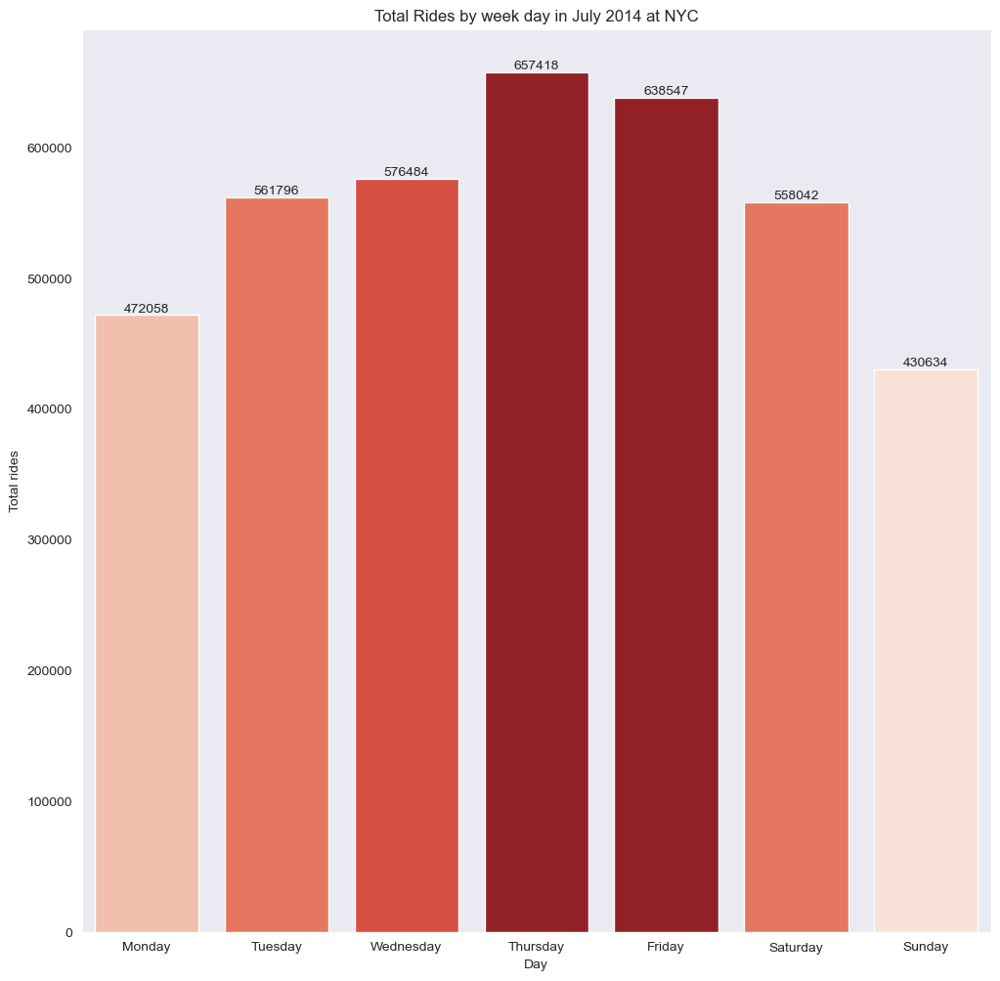

In [69]:
sns.set_style("dark")
plt.figure(figsize=(12,12))

#i am going to try customized palette, so that darker the color, higher the value.
vals = day_wise.to_numpy().ravel()  #to_numpy:make it array, ravel: dim reduction
normalized = (vals - np.min(vals)) / (np.max(vals) - np.min(vals)) #like minmaxscaler from ml
indices = np.round(normalized * (len(vals) - 1)).astype(np.int32) #round already makes int
#int32 for less space
palette = sns.color_palette('Reds', len(vals))
colorPal = np.array(palette).take(indices, axis=0)

#Creating a bar plot
ax=sns.barplot(x = day_wise.index,y= vals,palette=colorPal)
plt.ylabel('Total rides')
plt.title('Total Rides by week day in July 2014 at NYC')
for rect in ax.patches:  #rect as rectangle, ax.patches get every rectangle, aka patches
    ax.text(rect.get_x() + rect.get_width()/2.0,rect.get_height(),int(rect.get_height()), ha='center', va='bottom')
#last line is how func is in documentation, basically calculates and shows as text
#little tricky to write it from mind, I find plotly 10 times better 

In [70]:
import plotly.express as px

# Assuming daywise is a pandas Series or DataFrame
# with the index containing the weekdays and the values being the total rides for each weekday.
fig = px.bar(day_wise, x=day_wise.index, y=vals)

fig.update_layout(
    title='Total Rides by Weekday in July 2014 at NYC',
    xaxis_title='Weekday',
    yaxis_title='Total Rides',
)

# Add annotations to each bar
for idx, val in enumerate(vals):
    fig.add_annotation(
        x=day_wise.index[idx], y=val,
        text=str(int(val)),
        showarrow=True,
        arrowhead=1,
        ax=0, ay=-30
    )

fig.show()

# Week wise

In [71]:
weekly_data = weekly.groupby(['Day','Time'])['Rides'].mean()
weekly_data.head(10)

Day     Time    
Monday  00:00:00    11.895425
        00:15:00     9.764706
        00:30:00     8.666667
        00:45:00     7.699346
        01:00:00     6.699346
        01:15:00     6.326797
        01:30:00     5.104575
        01:45:00     4.222222
        02:00:00     4.071895
        02:15:00     3.843137
Name: Rides, dtype: float64

In [72]:
weekly_data= weekly_data.unstack(level=0)
weekly_data

Day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Time,,,,,,,
00:00:00,11.895425,10.849673,14.104575,16.797386,24.522876,46.058824,50.294118
00:15:00,9.764706,9.254902,10.973856,14.235294,20.542484,41.385621,47.483660
00:30:00,8.666667,8.379085,9.790850,12.261438,18.679739,36.169935,43.379085
00:45:00,7.699346,6.588235,8.346405,11.183007,15.326797,34.052288,40.594771
01:00:00,6.699346,6.209150,7.509804,9.875817,14.816993,30.993464,36.875817
...,...,...,...,...,...,...,...
22:45:00,24.692810,32.124183,37.202614,56.058824,68.660131,65.758170,26.124183
23:00:00,21.372549,26.849673,31.934641,50.294118,63.032680,65.771242,22.098039
23:15:00,17.888889,21.673203,26.313725,42.764706,59.705882,60.294118,18.392157


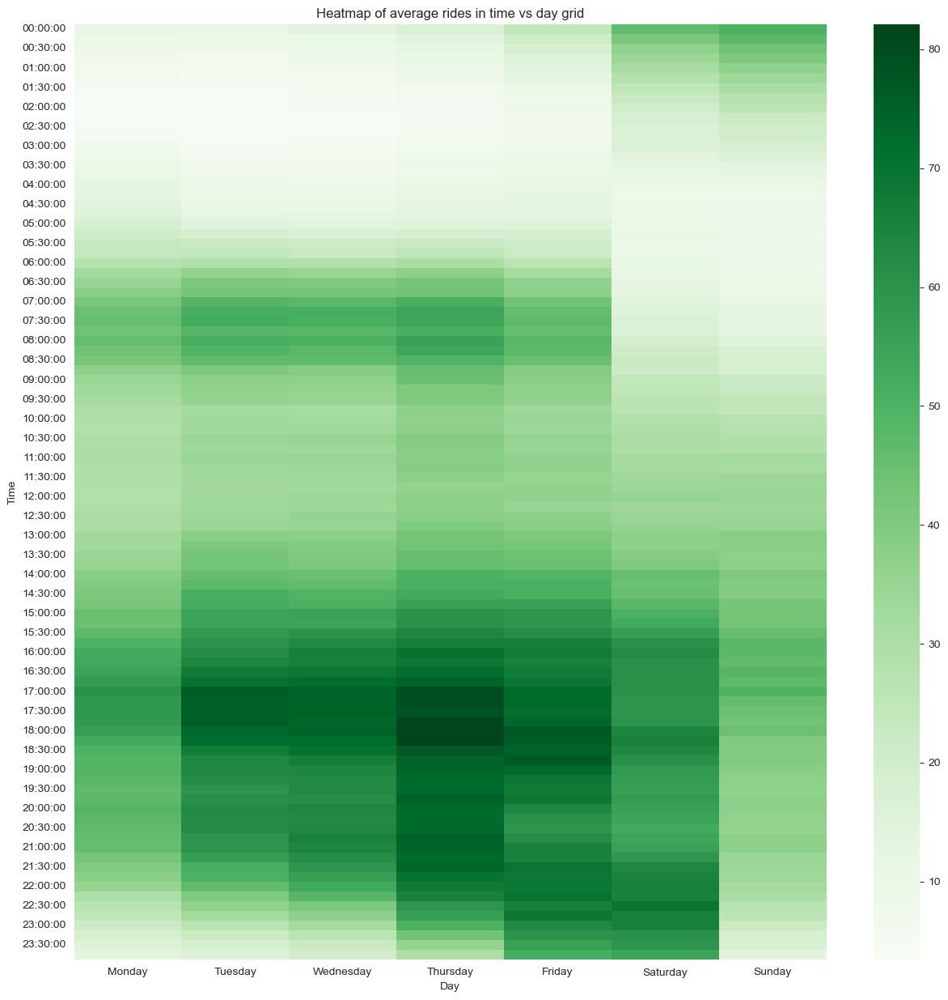

In [73]:
plt.figure(figsize=(15,15))
sns.heatmap(weekly_data,cmap='Greens')
_=plt.title('Heatmap of average rides in time vs day grid')

#thursday evening are so busy, weekday mornings are empty, sunday is usually calm

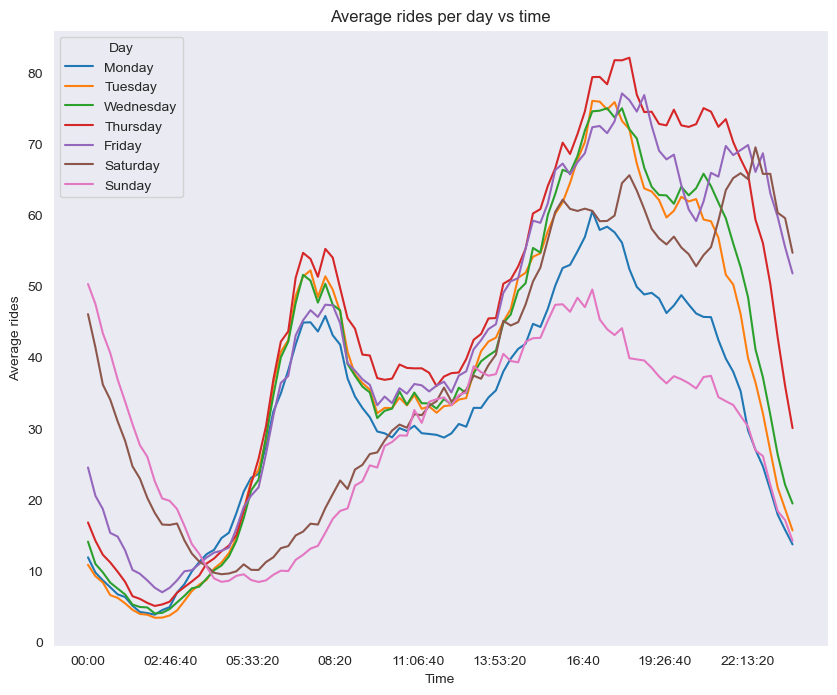

In [98]:
#another way, again making bins
plt.figure(figsize=(10,8))
weekly_data.plot(ax=plt.gca())
_=plt.title('Average rides per day vs time')
_=plt.ylabel('Average rides')
plt.locator_params(axis='x', nbins=10) #here I created 10 bins in x axis.

<font color=blue, size=15> Finding the rush location in map </font>

In [75]:
#lat is latitude, lon is longitude 
rush_loc = final.groupby(['Lat','Lon'], as_index = False).size()

In [76]:
rush_loc

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
551684,41.3195,-73.6903,1
551685,41.3199,-73.6902,1
551686,41.3225,-72.9634,1
551687,41.3413,-73.7493,1


In [77]:
#!pip install folium

In [78]:
import folium

In [79]:
basemap = folium.Map()

In [80]:
basemap

In [81]:
from folium.plugins import HeatMap


In [82]:
HeatMap(rush_loc).add_to(basemap)

In [83]:
basemap

<font color=blue, size=15> Hour and weekday, pairwise analysis </font>

In [84]:
final.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base', 'BinnedHour', 'Day', 'Date', 'Time'], dtype='object')

In [85]:
final.dtypes

Date/Time     datetime64[ns]
Lat                  float64
Lon                  float64
Base                  object
BinnedHour    datetime64[ns]
Day                 category
Date                  object
Time                  object
dtype: object

In [86]:
final['Date/Time'][0] #having multiple because of multiple dataset concat

0   2014-05-01 00:02:00
0   2014-06-01 00:00:00
0   2014-07-01 00:03:00
0   2014-09-01 00:01:00
0   2014-08-01 00:03:00
Name: Date/Time, dtype: datetime64[ns]

In [87]:
final['Date/Time'] = pd.to_datetime(final['Date/Time'], format="%m/%d/%Y %H:%M:%S")

In [88]:
final['Date/Time'].dtype

dtype('<M8[ns]')

In [89]:
final['day'] = final['Date/Time'].dt.day

In [90]:
final['hour'] = final['Date/Time'].dt.hour

In [91]:
final

,Date/Time,Lat,Lon,Base,BinnedHour,Day,Date,Time,day,hour
0,2014-05-01 00:02:00,40.7521,-73.9914,B02512,2014-05-01 00:00:00,Thursday,2014-05-01,00:00:00,1,0
1,2014-05-01 00:06:00,40.6965,-73.9715,B02512,2014-05-01 00:00:00,Thursday,2014-05-01,00:00:00,1,0
2,2014-05-01 00:15:00,40.7464,-73.9838,B02512,2014-05-01 00:15:00,Thursday,2014-05-01,00:15:00,1,0
3,2014-05-01 00:17:00,40.7463,-74.0011,B02512,2014-05-01 00:15:00,Thursday,2014-05-01,00:15:00,1,0
4,2014-05-01 00:17:00,40.7594,-73.9734,B02512,2014-05-01 00:15:00,Thursday,2014-05-01,00:15:00,1,0
...,...,...,...,...,...,...,...,...,...,...
829269,2014-08-31 23:55:00,40.7267,-73.9998,B02764,2014-08-31 23:45:00,Sunday,2014-08-31,23:45:00,31,23
829270,2014-08-31 23:55:00,40.7552,-73.9753,B02764,2014-08-31 23:45:00,Sunday,2014-08-31,23:45:00,31,23
829272,2014-08-31 23:55:00,40.7617,-73.9788,B02764,2014-08-31 23:45:00,Sunday,2014-08-31,23:45:00,31,23
829273,2014-08-31 23:59:00,40.7395,-73.9889,B02764,2014-08-31 23:45:00,Sunday,2014-08-31,23:45:00,31,23


In [92]:
final.groupby(['day','hour'], as_index = False).size()

,day,hour,size
0,1,0,3045
1,1,1,1882
2,1,2,1205
3,1,3,1218
4,1,4,1268
...,...,...,...
739,31,19,4898
740,31,20,4819
741,31,21,5064
742,31,22,5164


In [93]:
rush_details = final.groupby(['day','hour']).size().unstack()
rush_details

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,
1,3045,1882,1205,1218,1268,1801,2953,4395,4519,4092,...,6208,6947,7486,8257,7494,6998,6724,6937,5745,3736
2,2274,1488,1028,1338,1682,2476,4145,5461,5393,4068,...,6049,7325,8815,9527,9892,8408,7630,7374,6370,4816
3,3165,2041,1341,1339,1361,2041,3501,4647,4530,4072,...,6302,7620,8886,8865,9625,8236,7448,6838,5582,3902
4,2570,1508,1082,1272,1464,2204,3767,4843,4657,3984,...,5980,7028,7657,8104,7848,6992,6887,6744,5879,3809
5,2021,1134,817,1079,1465,2727,4614,5986,6133,5082,...,6256,7242,8315,9273,8607,8009,8024,8063,7048,4842
6,3072,1941,1369,1248,1352,1986,3473,4541,4632,3967,...,6545,7776,8650,9138,8509,7775,7607,8005,7471,5692
7,3543,2233,1450,1446,1496,2042,3273,4527,4547,4059,...,6422,7425,8661,8841,8459,7465,7531,7485,6556,4568
8,2645,1574,1062,1364,1708,2805,4556,6218,6305,5096,...,6528,7790,8660,9303,8639,7879,7489,7431,6215,3960
9,2504,1619,1146,1342,1682,2820,4990,6557,6672,5338,...,7038,8112,9009,10437,10252,8666,7922,7685,6795,4846


In [94]:
rush_details.style.background_gradient()

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3045,1882,1205,1218,1268,1801,2953,4395,4519,4092,4134,4187,4467,5208,6208,6947,7486,8257,7494,6998,6724,6937,5745,3736
2,2274,1488,1028,1338,1682,2476,4145,5461,5393,4068,4145,4276,4564,4993,6049,7325,8815,9527,9892,8408,7630,7374,6370,4816
3,3165,2041,1341,1339,1361,2041,3501,4647,4530,4072,4236,4522,4771,5335,6302,7620,8886,8865,9625,8236,7448,6838,5582,3902
4,2570,1508,1082,1272,1464,2204,3767,4843,4657,3984,3998,4170,4373,5188,5980,7028,7657,8104,7848,6992,6887,6744,5879,3809
5,2021,1134,817,1079,1465,2727,4614,5986,6133,5082,4621,4474,4395,5047,6256,7242,8315,9273,8607,8009,8024,8063,7048,4842
6,3072,1941,1369,1248,1352,1986,3473,4541,4632,3967,4263,4615,4841,5597,6545,7776,8650,9138,8509,7775,7607,8005,7471,5692
7,3543,2233,1450,1446,1496,2042,3273,4527,4547,4059,4405,4686,4905,5639,6422,7425,8661,8841,8459,7465,7531,7485,6556,4568
8,2645,1574,1062,1364,1708,2805,4556,6218,6305,5096,4786,4809,4974,5738,6528,7790,8660,9303,8639,7879,7489,7431,6215,3960
9,2504,1619,1146,1342,1682,2820,4990,6557,6672,5338,4880,4898,4914,5745,7038,8112,9009,10437,10252,8666,7922,7685,6795,4846


<font color=blue, size=15> Automation for the next files </font>

In [95]:
def rush_analyze(df,col1,col2):
    rush_time = final.groupby(['day', 'hour']).size().unstack()
    return rush_time.style.background_gradient()

In [96]:
rush_analyze(final,'day','hour')

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3045,1882,1205,1218,1268,1801,2953,4395,4519,4092,4134,4187,4467,5208,6208,6947,7486,8257,7494,6998,6724,6937,5745,3736
2,2274,1488,1028,1338,1682,2476,4145,5461,5393,4068,4145,4276,4564,4993,6049,7325,8815,9527,9892,8408,7630,7374,6370,4816
3,3165,2041,1341,1339,1361,2041,3501,4647,4530,4072,4236,4522,4771,5335,6302,7620,8886,8865,9625,8236,7448,6838,5582,3902
4,2570,1508,1082,1272,1464,2204,3767,4843,4657,3984,3998,4170,4373,5188,5980,7028,7657,8104,7848,6992,6887,6744,5879,3809
5,2021,1134,817,1079,1465,2727,4614,5986,6133,5082,4621,4474,4395,5047,6256,7242,8315,9273,8607,8009,8024,8063,7048,4842
6,3072,1941,1369,1248,1352,1986,3473,4541,4632,3967,4263,4615,4841,5597,6545,7776,8650,9138,8509,7775,7607,8005,7471,5692
7,3543,2233,1450,1446,1496,2042,3273,4527,4547,4059,4405,4686,4905,5639,6422,7425,8661,8841,8459,7465,7531,7485,6556,4568
8,2645,1574,1062,1364,1708,2805,4556,6218,6305,5096,4786,4809,4974,5738,6528,7790,8660,9303,8639,7879,7489,7431,6215,3960
9,2504,1619,1146,1342,1682,2820,4990,6557,6672,5338,4880,4898,4914,5745,7038,8112,9009,10437,10252,8666,7922,7685,6795,4846
